In [4]:
import px4tools
import ast
import pandas as pd
import json
import matplotlib.pyplot as plt
from kneed import KneeLocator
from sklearn.datasets import make_blobs
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
import seaborn as sns
from wordcloud import WordCloud
import multidict as multidict
import re
from tqdm import tqdm
%matplotlib inline

# Configuration
CACHE_DIR = "./Cache"

### Utility functions

In [5]:
def read_json(json_filename):
    with open(f"{CACHE_DIR}/{json_filename}", 'r') as f: 
        json_object = json.load(f)
    return json_object

def read_ulg_data(log_file):
    data = None
    try:
        data = px4tools.read_ulog(log_file)
    except:
        None
    return data

### Defining column variables here

In [6]:
issue_identifier_cols = ['issue_id', 'log_id']
metadata_cols = ['title', 'labels', 'state', 'comments', 'created_at', 'updated_at', 'closed_at', 'body']
log_fields_cols = read_json('log_unique_fields.json')

### Load dataframe for issue_id -> fields available in log

In [7]:
data = pd.read_pickle(f"{CACHE_DIR}/fields_across_logs_with_metadata.pkl")

### Plot frequencies of each field to figure out important/common ones

In [8]:
metric_counts = data[log_fields_cols].sum()
metric_counts = metric_counts.reset_index()
metric_counts.columns=['metric', 'freq']
metric_counts = metric_counts.sort_values(by='freq', ascending=False)

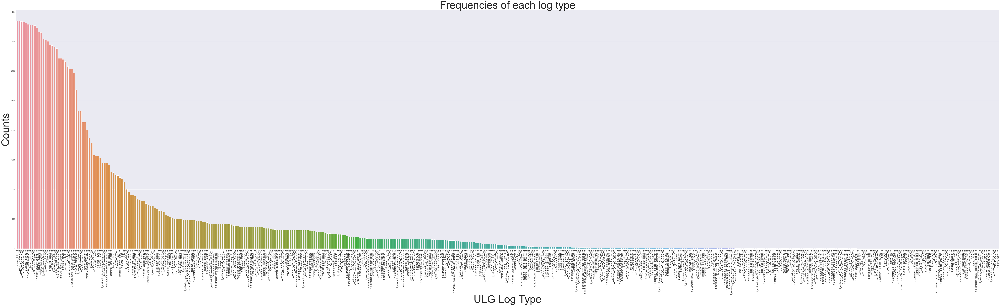

In [9]:
sns.set(rc={'figure.figsize':(120, 30)})
ax = sns.barplot(data=metric_counts, x='metric', y='freq')
ax.set_title('Frequencies of each log type', fontsize=72)
ax.set_xticklabels(labels=list(metric_counts['metric']), rotation=90, fontsize=16)
ax.set_ylabel("Counts", fontsize=72)
ax.set_xlabel("ULG Log Type", fontsize=72);

### Choose important features (top 80 percentile)

In [10]:
# Get top 80 percentile
quartile = metric_counts.freq.quantile(0.8)
metric_counts = metric_counts[metric_counts['freq'] >= quartile]

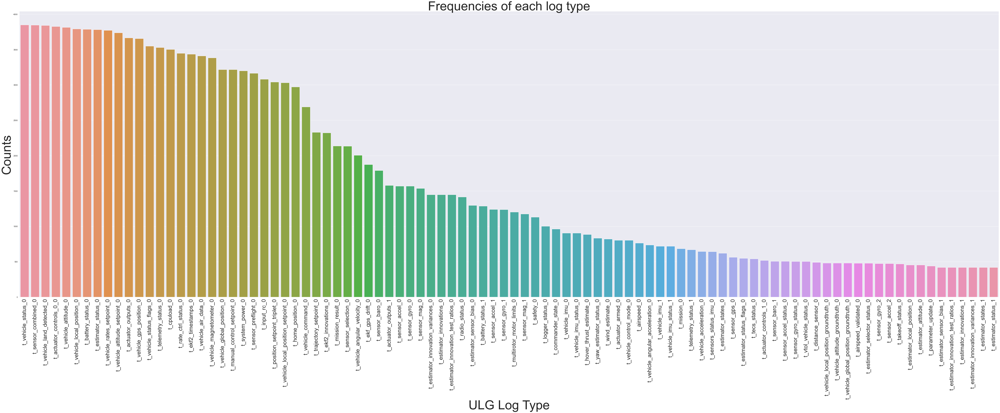

In [11]:
sns.set(rc={'figure.figsize':(100, 30)})
ax = sns.barplot(data=metric_counts, x='metric', y='freq')
ax.set_title('Frequencies of each log type', fontsize=72)
ax.set_xticklabels(labels=list(metric_counts['metric']), rotation=90, fontsize=32)
ax.set_ylabel("Counts", fontsize=72)
ax.set_xlabel("ULG Log Type", fontsize=72);

In [12]:
print(f"The top 80 percentile values contains these {len(metric_counts)} fields ->")
metric_counts['metric'].to_list()

The top 80 percentile values contains these 94 fields ->


['t_vehicle_status_0',
 't_sensor_combined_0',
 't_vehicle_land_detected_0',
 't_actuator_controls_0_0',
 't_vehicle_attitude_0',
 't_vehicle_local_position_0',
 't_battery_status_0',
 't_estimator_status_0',
 't_vehicle_rates_setpoint_0',
 't_vehicle_attitude_setpoint_0',
 't_actuator_outputs_0',
 't_vehicle_gps_position_0',
 't_vehicle_status_flags_0',
 't_telemetry_status_0',
 't_cpuload_0',
 't_rate_ctrl_status_0',
 't_ekf2_timestamps_0',
 't_vehicle_air_data_0',
 't_vehicle_magnetometer_0',
 't_vehicle_global_position_0',
 't_manual_control_setpoint_0',
 't_system_power_0',
 't_sensor_preflight_0',
 't_input_rc_0',
 't_position_setpoint_triplet_0',
 't_vehicle_local_position_setpoint_0',
 't_home_position_0',
 't_vehicle_command_0',
 't_trajectory_setpoint_0',
 't_ekf2_innovations_0',
 't_mission_result_0',
 't_sensor_selection_0',
 't_vehicle_angular_velocity_0',
 't_ekf_gps_drift_0',
 't_sensor_baro_0',
 't_actuator_outputs_1',
 't_sensor_accel_0',
 't_sensor_gyro_0',
 't_sensor

### Do K-Means Clustering Based on presence of these "important" features

In [13]:
data[issue_identifier_cols+log_fields_cols]

,issue_id,log_id,t_irlock_report_0,t_estimator_aid_src_ev_vel_0,t_estimator_visual_odometry_aligned_0,t_system_power_0,t_obstacle_distance_fused_0,t_estimator_optical_flow_vel_1,t_wind_estimate_4,t_estimator_status_flags_4,...,t_estimator_status_2,t_sensor_gyro_2,t_manual_control_switches_0,t_estimator_rng_hgt_bias_4,t_timesync_status_0,t_log_message_incoming_0,t_battery_status_1,t_sensor_gyro_status_0,t_sensor_gyro_fft_0,t_estimator_attitude_4
0,10003,1,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
1,10003,2,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,10003,3,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,10003,4,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
4,10003,5,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3856,9978,1,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
3857,9978,2,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3858,9978,3,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
3859,9984,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [14]:
# Picking the important fields designated above
important_fields = metric_counts['metric'].to_list()
features = data[important_fields].to_numpy()

kmeans = KMeans(
    init="random",
    n_clusters=3,
    n_init=10,
    max_iter=300,
    random_state=42
)

kmeans.fit(features)

KMeans(init='random', n_clusters=3, random_state=42)

In [15]:
cluster_assignments = kmeans.labels_
cluster_counts = pd.DataFrame(cluster_assignments).value_counts()

# Appending the cluster assignments to our main DataFrame
data.insert(2, "cluster_assignment", cluster_assignments)

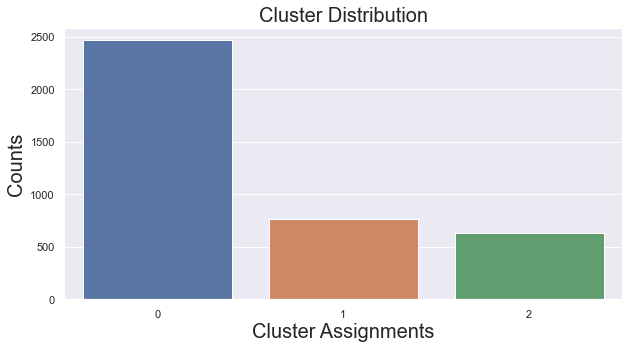

In [16]:
sns.set(rc={'figure.figsize':(10, 5)})
ax = sns.barplot(data={
    'clusters': [index for index in range(len(cluster_counts))],
    'counts': cluster_counts.to_list()
}, x='clusters', y='counts')
ax.set_title('Cluster Distribution', fontsize=20)
ax.set_ylabel("Counts", fontsize=20)
ax.set_xlabel("Cluster Assignments", fontsize=20);

### Try optimize for k

In [17]:
kmeans_kwargs = {
    "init": "random",
    "n_init": 10,
    "max_iter": 300,
    "random_state": 42,
}

# A list holds the SSE values for each k
sse = []
for k in range(1, 11):
    kmeans = KMeans(n_clusters=k, **kmeans_kwargs)
    kmeans.fit(features)
    sse.append(kmeans.inertia_)
    
kl = KneeLocator(
    range(1, 11), sse, curve="convex", direction="decreasing"
)
optimal_k = kl.elbow

An elbow was detected around cluster=3, so choosing k=3


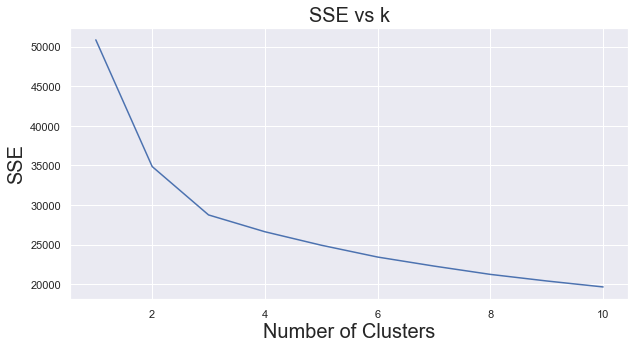

In [18]:
print(f"An elbow was detected around cluster={optimal_k}, so choosing k={optimal_k}")

sns.set(rc={'figure.figsize':(10, 5)})
ax = sns.lineplot(data={
    'clusters': range(1, 11),
    'sse': sse
}, x='clusters', y='sse')
ax.set_title('SSE vs k', fontsize=20)
ax.set_ylabel("SSE", fontsize=20)
ax.set_xlabel("Number of Clusters", fontsize=20);

### Further analysis on issue metadata to correlate cluster assignments with the issue data

In [19]:
metadata = data[issue_identifier_cols + ["cluster_assignment"] + metadata_cols].copy(deep=True)

### Converting the label arrays to strings

In [20]:
label_df = metadata["labels"].copy()
label_df = label_df.apply(lambda label_string: " ".join(ast.literal_eval(label_string)))
metadata.loc[:, "labels"] = label_df.values

In [21]:
metadata

,issue_id,log_id,cluster_assignment,title,labels,state,comments,created_at,updated_at,closed_at,body
0,10003,1,0,Yaw remove slewrate,,closed,13,2018-07-23T13:37:17Z,2019-03-26T15:28:00Z,2018-08-03T06:24:35Z,Similar to this [PR](https://github.com/PX4/Fi...
1,10003,2,0,Yaw remove slewrate,,closed,13,2018-07-23T13:37:17Z,2019-03-26T15:28:00Z,2018-08-03T06:24:35Z,Similar to this [PR](https://github.com/PX4/Fi...
2,10003,3,0,Yaw remove slewrate,,closed,13,2018-07-23T13:37:17Z,2019-03-26T15:28:00Z,2018-08-03T06:24:35Z,Similar to this [PR](https://github.com/PX4/Fi...
3,10003,4,0,Yaw remove slewrate,,closed,13,2018-07-23T13:37:17Z,2019-03-26T15:28:00Z,2018-08-03T06:24:35Z,Similar to this [PR](https://github.com/PX4/Fi...
4,10003,5,0,Yaw remove slewrate,,closed,13,2018-07-23T13:37:17Z,2019-03-26T15:28:00Z,2018-08-03T06:24:35Z,Similar to this [PR](https://github.com/PX4/Fi...
...,...,...,...,...,...,...,...,...,...,...,...
3856,9978,1,0,Minimal HW manifest support need for FMUv5,,closed,4,2018-07-18T22:55:14Z,2018-07-25T03:11:24Z,2018-07-20T16:29:59Z,Platforms that provide HW versioning tend to h...
3857,9978,2,0,Minimal HW manifest support need for FMUv5,,closed,4,2018-07-18T22:55:14Z,2018-07-25T03:11:24Z,2018-07-20T16:29:59Z,Platforms that provide HW versioning tend to h...
3858,9978,3,0,Minimal HW manifest support need for FMUv5,,closed,4,2018-07-18T22:55:14Z,2018-07-25T03:11:24Z,2018-07-20T16:29:59Z,Platforms that provide HW versioning tend to h...
3859,9984,1,0,Intel Aero: mission upload broken on master,bug intel aero wontfix,closed,7,2018-07-19T19:17:19Z,2019-03-26T23:49:09Z,2019-02-04T19:59:27Z,Flashed master ade70cb and the mission that wa...


### Utility functions relating to WordCloud

In [22]:
def get_wordcloud_data(data, column, remove_intersection=False):
    wordcloud_data = {}

    # Gather the text columns from "column" 
    for cluster in data["cluster_assignment"].unique():
        wordcloud_data[cluster] = []
        cluster_points = data[data["cluster_assignment"] == cluster]
        desired_col = cluster_points[column]    
        for value in desired_col:
            if value and len(value) > 0:
                wordcloud_data[cluster].append(value.lower().lstrip().rstrip().replace("\n", " "))
    
    wordcloud_data_merged = {}
    for cluster in data["cluster_assignment"].unique():
        text = " ".join(wordcloud_data[cluster])
        wordcloud_data_merged[cluster] = text
    
    # Intersection removal logic
    # Take the arrays created on top and get unique words out of that
    wordcloud_unique_set = {}
    wordcloud_data_set = {}
    for cluster in data["cluster_assignment"].unique():
        rough_words_size = len(wordcloud_data_merged[cluster].split(" "))
        
        wordcloud = WordCloud(
            max_words=rough_words_size,
            max_font_size=40,
            relative_scaling=.5
        ).generate_from_text(wordcloud_data_merged[cluster])
        
        unique_words = wordcloud.words_.keys()
        wordcloud_unique_set[cluster] = set(unique_words)
        wordcloud_data_set[cluster] = wordcloud.words_
        
    if remove_intersection:
        # Find duplicate words
        common_words = wordcloud_unique_set[data["cluster_assignment"].unique()[0]]
        for cluster in wordcloud_unique_set:
            common_words = common_words.intersection(wordcloud_unique_set[cluster])

        # Eliminate duplicate words
        for cluster in wordcloud_unique_set:
            wordcloud_unique_set[cluster] = wordcloud_unique_set[cluster].difference(common_words)
        for cluster in wordcloud_unique_set:
            wordcloud_data_set[cluster] = { word: wordcloud_data_set[cluster][word] for word in wordcloud_data_set[cluster] if word in wordcloud_unique_set[cluster]}
    
    return wordcloud_data_set    

def plot_wordcloud(wordcloud_data, title, max_words):
    fig, axs = plt.subplots(1, 3, figsize=(50, 15))    
    axis_count = 0
    for cluster in wordcloud_data:
        wordcloud_img = None
        word_freq_map = wordcloud_data[cluster]
        rough_words_size = len(word_freq_map)
        
        wordcloud = WordCloud(
            max_words=max_words,
            max_font_size=40,
            relative_scaling=.5
        )
        wordcloud_img = wordcloud.generate_from_frequencies(word_freq_map)        

        words = len(wordcloud_img.words_.keys())
        axs[axis_count].set_title(f"Cluster = {cluster}\nWords: {words}", fontsize=48)
        axs[axis_count].imshow(wordcloud_img, interpolation="bilinear", aspect = "auto")
        axs[axis_count].set_axis_off()        
        axis_count += 1
    
    fig.suptitle(title + "\n", fontsize=100)
    fig.subplots_adjust(top=0.88)
    fig.tight_layout()
    plt.show()

### GitHub "Issue Labels" wordcloud for each cluster

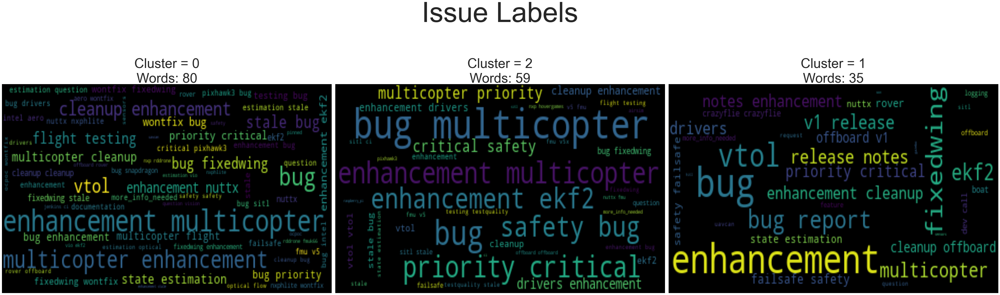

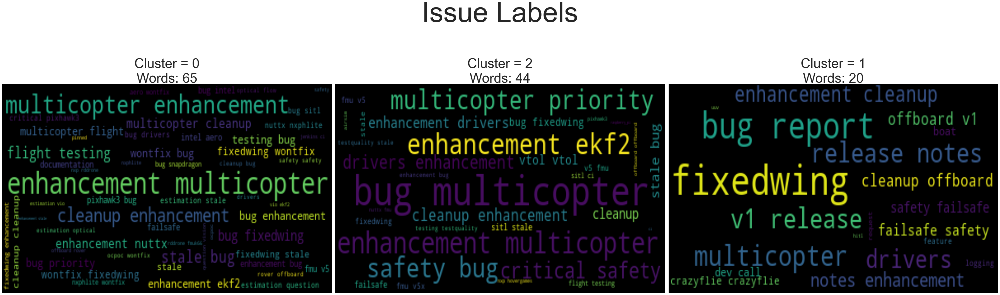

In [23]:
issue_wordcloud_data = get_wordcloud_data(data=metadata, column='labels')
plot_wordcloud(wordcloud_data=issue_wordcloud_data, title="Issue Labels", max_words=1000)

issue_wordcloud_data = get_wordcloud_data(data=metadata, column='labels', remove_intersection=True)
plot_wordcloud(wordcloud_data=issue_wordcloud_data, title="Issue Labels", max_words=1000)

### GitHub "Issue Titles" wordcloud for each cluster

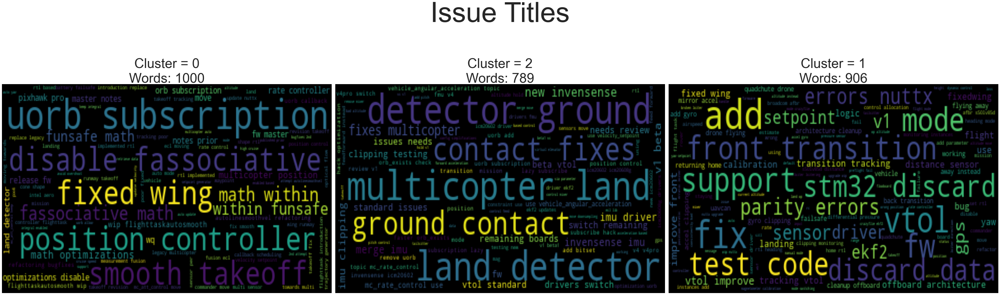

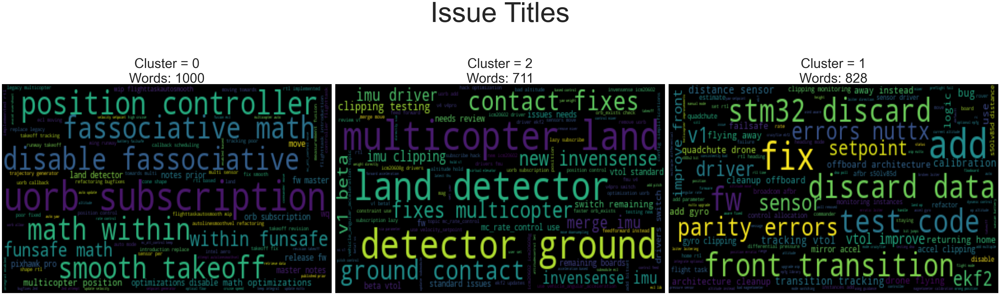

In [24]:
issue_wordcloud_data = get_wordcloud_data(data=metadata, column='title')
plot_wordcloud(wordcloud_data=issue_wordcloud_data, title="Issue Titles", max_words=1000)

issue_wordcloud_data = get_wordcloud_data(data=metadata, column='title', remove_intersection=True)
plot_wordcloud(wordcloud_data=issue_wordcloud_data, title="Issue Titles", max_words=1000)

### GitHub "Issue Body" wordcloud for each cluster

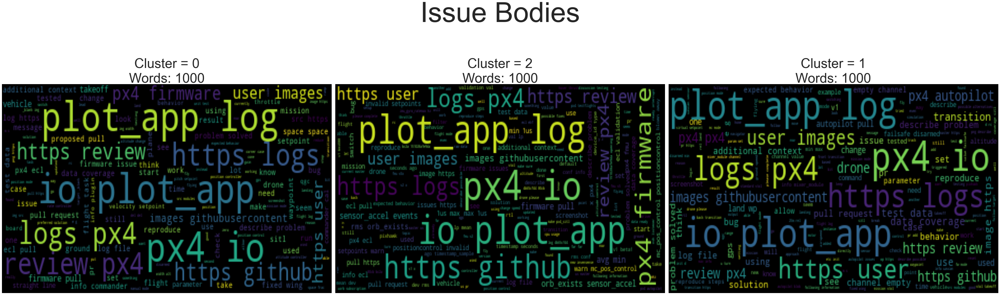

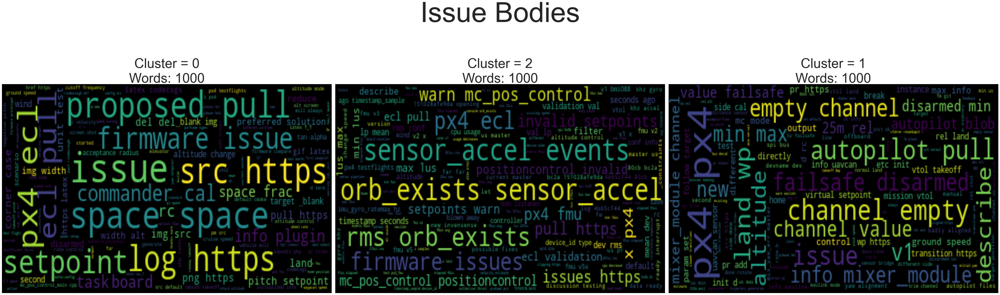

In [25]:
issue_wordcloud_data = get_wordcloud_data(data=metadata, column='body')
plot_wordcloud(wordcloud_data=issue_wordcloud_data, title="Issue Bodies", max_words=1000)

issue_wordcloud_data = get_wordcloud_data(data=metadata, column='body', remove_intersection=True)
plot_wordcloud(wordcloud_data=issue_wordcloud_data, title="Issue Bodies", max_words=1000)

### Gathering out some log data samples for the important fields

In [26]:
important_fields_sample = {}
field_identification = data[issue_identifier_cols + important_fields].copy()

log_file_paths = read_json('log_file_paths.json')
for field in tqdm(important_fields):
    log_to_read = field_identification[field_identification[field] == 1].iloc[0]
    log_file_data = read_ulg_data(log_file_paths[log_to_read.issue_id][log_to_read.log_id-1])
    if log_file_data:
        if field in log_file_data and field not in important_fields_sample:
            important_fields_sample[field] = log_file_data[field]

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 94/94 [00:48<00:00,  1.93it/s]


In [27]:
important_fields[:10]

['t_vehicle_status_0',
 't_sensor_combined_0',
 't_vehicle_land_detected_0',
 't_actuator_controls_0_0',
 't_vehicle_attitude_0',
 't_vehicle_local_position_0',
 't_battery_status_0',
 't_estimator_status_0',
 't_vehicle_rates_setpoint_0',
 't_vehicle_attitude_setpoint_0']

In [28]:
important_fields_sample['t_sensor_combined_0']

,timestamp,f_gyro_rad_0_,f_gyro_rad_1_,f_gyro_rad_2_,f_gyro_integral_dt,f_accelerometer_timestamp_relative,f_accelerometer_m_s2_0_,f_accelerometer_m_s2_1_,f_accelerometer_m_s2_2_,f_accelerometer_integral_dt
timestamp,,,,,,,,,,
0 days 00:19:14.925634,1154925634,-0.006437,-0.005189,-0.008292,4000,0,0.178189,0.315160,-9.561528,4000
0 days 00:19:14.929636,1154929636,-0.010642,-0.026160,-0.009495,4002,0,-0.216975,0.043981,-10.000409,4002
0 days 00:19:14.933635,1154933635,-0.000753,0.003828,-0.007250,3999,0,-0.316535,0.449397,-10.040401,3999
0 days 00:19:14.937635,1154937635,0.010250,0.001580,-0.006574,4000,0,-0.314330,0.306980,-9.786257,4000
0 days 00:19:14.941635,1154941635,-0.000534,-0.008306,-0.009485,4000,0,-0.380275,0.078263,-9.965021,4000
...,...,...,...,...,...,...,...,...,...,...
0 days 00:24:04.939235,1444939235,-0.006784,-0.003731,0.012594,3999,0,-0.733895,0.227965,-9.879676,3999
0 days 00:24:04.943236,1444943236,-0.004173,0.001032,0.009015,4001,0,-0.745244,0.184682,-9.891568,4001
0 days 00:24:04.947236,1444947236,-0.004150,0.003387,0.004759,4000,0,-0.708724,0.165323,-9.788226,4000


In [29]:
important_fields_sample['t_vehicle_status_0']

,timestamp,f_onboard_control_sensors_present,f_onboard_control_sensors_enabled,f_onboard_control_sensors_health,f_nav_state,f_arming_state,f_hil_state,f_failsafe,f_system_type,f_system_id,...,f_vtol_fw_permanent_stab,f_in_transition_mode,f_in_transition_to_fw,f_rc_signal_lost,f_rc_input_mode,f_data_link_lost,f_high_latency_data_link_active,f_data_link_lost_counter,f_engine_failure,f_mission_failure
timestamp,,,,,,,,,,,,,,,,,,,,,
0 days 00:19:14.886185,1154886185,3080239,2162703,3080239,2,2,0,0,2,1,...,0,0,0,0,0,0,0,0,0,0
0 days 00:19:15.891562,1155891562,3080239,2162703,3080239,2,2,0,0,2,1,...,0,0,0,0,0,0,0,0,0,0
0 days 00:19:16.893434,1156893434,3080239,2162703,3080239,2,2,0,0,2,1,...,0,0,0,0,0,0,0,0,0,0
0 days 00:19:17.894754,1157894754,3080239,2162703,3080239,2,2,0,0,2,1,...,0,0,0,0,0,0,0,0,0,0
0 days 00:19:18.899539,1158899539,3080239,2162703,3080239,2,2,0,0,2,1,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
0 days 00:24:00.785779,1440785779,3080239,2162703,3080239,5,2,0,0,2,1,...,0,0,0,0,0,0,0,0,0,0
0 days 00:24:01.786754,1441786754,3080239,2162703,3080239,5,2,0,0,2,1,...,0,0,0,0,0,0,0,0,0,0
0 days 00:24:02.788769,1442788769,3080239,2162703,3080239,5,2,0,0,2,1,...,0,0,0,0,0,0,0,0,0,0


In [31]:
important_fields_sample.keys()

dict_keys(['t_vehicle_status_0', 't_sensor_combined_0', 't_vehicle_land_detected_0', 't_actuator_controls_0_0', 't_vehicle_attitude_0', 't_vehicle_local_position_0', 't_battery_status_0', 't_estimator_status_0', 't_vehicle_rates_setpoint_0', 't_vehicle_attitude_setpoint_0', 't_actuator_outputs_0', 't_vehicle_gps_position_0', 't_vehicle_status_flags_0', 't_telemetry_status_0', 't_cpuload_0', 't_rate_ctrl_status_0', 't_ekf2_timestamps_0', 't_vehicle_air_data_0', 't_vehicle_magnetometer_0', 't_vehicle_global_position_0', 't_manual_control_setpoint_0', 't_system_power_0', 't_sensor_preflight_0', 't_input_rc_0', 't_position_setpoint_triplet_0', 't_vehicle_local_position_setpoint_0', 't_home_position_0', 't_vehicle_command_0', 't_trajectory_setpoint_0', 't_ekf2_innovations_0', 't_mission_result_0', 't_sensor_selection_0', 't_vehicle_angular_velocity_0', 't_ekf_gps_drift_0', 't_sensor_baro_0', 't_actuator_outputs_1', 't_sensor_accel_0', 't_sensor_gyro_0', 't_sensor_mag_0', 't_estimator_innova

In [37]:
important_fields_sample['t_vehicle_global_position_0']

,timestamp,f_lat,f_lon,f_alt,f_delta_alt,f_vel_n,f_vel_e,f_vel_d,f_yaw,f_eph,f_epv,f_terrain_alt,f_lat_lon_reset_counter,f_alt_reset_counter,f_terrain_alt_valid,f_dead_reckoning
timestamp,,,,,,,,,,,,,,,,
0 days 00:19:14.921957,1154921957,32.515023,-116.955863,41.554794,-0.0,0.038440,0.033801,-0.001838,0.365416,0.727367,0.857260,0.0,2,0,0,0
0 days 00:19:15.121959,1155121959,32.515023,-116.955863,41.558815,-0.0,0.038185,0.036491,-0.004086,0.365506,0.727353,0.857064,0.0,2,0,0,0
0 days 00:19:15.330759,1155330759,32.515023,-116.955862,41.569855,-0.0,0.033275,0.035705,-0.006920,0.365723,0.727854,0.857060,0.0,2,0,0,0
0 days 00:19:15.530769,1155530769,32.515023,-116.955862,41.582977,-0.0,0.034215,0.038856,-0.008846,0.365763,0.727895,0.856909,0.0,2,0,0,0
0 days 00:19:15.730776,1155730776,32.515023,-116.955862,41.592686,-0.0,0.032791,0.039803,-0.013452,0.366004,0.727819,0.856737,0.0,2,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
0 days 00:24:04.138791,1444138791,32.515032,-116.955871,41.683201,-0.0,0.074005,0.008748,0.080944,0.360791,0.707033,0.856288,0.0,2,0,0,0
0 days 00:24:04.346755,1444346755,32.515032,-116.955871,41.657463,-0.0,0.069819,0.012041,0.084824,0.361249,0.707625,0.856314,0.0,2,0,0,0
0 days 00:24:04.546763,1444546763,32.515032,-116.955871,41.622204,-0.0,0.064215,0.011312,0.091863,0.361717,0.707737,0.856626,0.0,2,0,0,0


In [38]:
important_fields_sample['t_vehicle_attitude_0']

,timestamp,f_rollspeed,f_pitchspeed,f_yawspeed,f_q_0_,f_q_1_,f_q_2_,f_q_3_,f_delta_q_reset_0_,f_delta_q_reset_1_,f_delta_q_reset_2_,f_delta_q_reset_3_,f_quat_reset_counter
timestamp,,,,,,,,,,,,,
0 days 00:19:14.926012,1154926012,-0.008376,-0.000575,-0.008698,0.983289,-0.005794,-0.011696,0.181581,0.98941,0.085134,0.030334,0.113577,1
0 days 00:19:14.953985,1154953985,-0.000033,0.014219,-0.004253,0.983308,-0.005818,-0.011719,0.181477,0.98941,0.085134,0.030334,0.113577,1
0 days 00:19:14.986014,1154986014,-0.009627,-0.008885,-0.011537,0.983296,-0.005853,-0.011751,0.181540,0.98941,0.085134,0.030334,0.113577,1
0 days 00:19:15.017997,1155017997,-0.005212,-0.002864,0.011782,0.983293,-0.005863,-0.011767,0.181554,0.98941,0.085134,0.030334,0.113577,1
0 days 00:19:15.050004,1155050004,0.010474,-0.003590,-0.008745,0.983281,-0.005887,-0.011792,0.181617,0.98941,0.085134,0.030334,0.113577,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...
0 days 00:24:04.827575,1444827575,-0.007768,-0.001380,-0.004513,0.982953,-0.001514,-0.039907,0.179469,0.98941,0.085134,0.030334,0.113577,1
0 days 00:24:04.859596,1444859596,0.004206,0.000650,0.007674,0.982957,-0.001501,-0.039857,0.179459,0.98941,0.085134,0.030334,0.113577,1
0 days 00:24:04.891555,1444891555,-0.005904,0.003774,-0.011355,0.982946,-0.001528,-0.039884,0.179513,0.98941,0.085134,0.030334,0.113577,1


In [48]:
metadata

,issue_id,log_id,cluster_assignment,title,labels,state,comments,created_at,updated_at,closed_at,body
0,10003,1,0,Yaw remove slewrate,,closed,13,2018-07-23T13:37:17Z,2019-03-26T15:28:00Z,2018-08-03T06:24:35Z,Similar to this [PR](https://github.com/PX4/Fi...
1,10003,2,0,Yaw remove slewrate,,closed,13,2018-07-23T13:37:17Z,2019-03-26T15:28:00Z,2018-08-03T06:24:35Z,Similar to this [PR](https://github.com/PX4/Fi...
2,10003,3,0,Yaw remove slewrate,,closed,13,2018-07-23T13:37:17Z,2019-03-26T15:28:00Z,2018-08-03T06:24:35Z,Similar to this [PR](https://github.com/PX4/Fi...
3,10003,4,0,Yaw remove slewrate,,closed,13,2018-07-23T13:37:17Z,2019-03-26T15:28:00Z,2018-08-03T06:24:35Z,Similar to this [PR](https://github.com/PX4/Fi...
4,10003,5,0,Yaw remove slewrate,,closed,13,2018-07-23T13:37:17Z,2019-03-26T15:28:00Z,2018-08-03T06:24:35Z,Similar to this [PR](https://github.com/PX4/Fi...
...,...,...,...,...,...,...,...,...,...,...,...
3856,9978,1,0,Minimal HW manifest support need for FMUv5,,closed,4,2018-07-18T22:55:14Z,2018-07-25T03:11:24Z,2018-07-20T16:29:59Z,Platforms that provide HW versioning tend to h...
3857,9978,2,0,Minimal HW manifest support need for FMUv5,,closed,4,2018-07-18T22:55:14Z,2018-07-25T03:11:24Z,2018-07-20T16:29:59Z,Platforms that provide HW versioning tend to h...
3858,9978,3,0,Minimal HW manifest support need for FMUv5,,closed,4,2018-07-18T22:55:14Z,2018-07-25T03:11:24Z,2018-07-20T16:29:59Z,Platforms that provide HW versioning tend to h...
3859,9984,1,0,Intel Aero: mission upload broken on master,bug intel aero wontfix,closed,7,2018-07-19T19:17:19Z,2019-03-26T23:49:09Z,2019-02-04T19:59:27Z,Flashed master ade70cb and the mission that wa...
